# HCP Motor task : Scores Subtype analysis from niak preprocessed data
The goal of this notebook is to run a subtype analysis on the HCP dataset and to look at the subtype weights following Pierre Orban's analysis. Here are the central research questions:

1. What are subtypes of scores maps for different networks (7 network resolution on Cambridge) and how do they look like?
2. What are the individual subject weights for these subtypes (violin plots and Pierre's matrix)
3. For which networks and subtypes is diagnosis a significant predictor of weights?
4. What do weights for these subtypes and networks look like for patients and healthy controls?

In [1]:
sebmode = False

In [20]:
# Imports
import os
import sys
import glob
import shelve
import gzip
import cPickle as pickle
import numpy as np
import pandas as pd
import nibabel as nib
#import brainbox as bb
import nilearn as nil
import statsmodels.api as sm
from scipy import stats as st
from matplotlib import gridspec
from scipy import cluster as scl
from nilearn import plotting as nlp
from matplotlib import pyplot as plt
from sklearn import linear_model as slin
from statsmodels.sandbox import stats as sts
from matplotlib.colors import LinearSegmentedColormap
if sebmode:
    import brainbox as bb

In [21]:
%matplotlib inline

# Paths

In [22]:
# Paths
subtypes = 5
tpl = 'HCP{}_session1_molr_stability_maps.nii.gz'
prior_path = './template_cambridge_basc_partition_consensus_group_sci10_scg7_scf7.nii.gz'
data_path = './stability_maps_MOTOR_niak_preproc_task-specific_prior_nii/'
pheno_path = './RESTRICTED_yassinebha_1_6_2015_14_22_6.csv'
fd_path = './qc_scrubbing_group.csv'
pheno2_path = './unrestricted_yassinebha_1_13_2016_13_53_17_FD.csv'
mask_path = './mask.nii.gz'
out_path = './sc7_niak/'

In [23]:
# Get the mask
m_img = nib.load(mask_path)
mask_data = m_img.get_data()
mask = mask_data != 0
print('NVoxels = {}'.format(np.sum(mask)))

NVoxels = 76611


In [24]:
#Merge Phenotypes tables
pheno1 = pd.read_csv(pheno_path)
pheno2  = pd.read_csv(pheno2_path)
fd = pd.read_csv(fd_path)
pheno_merge = pd.merge(pheno1, pheno2, how='left' ,on='Subject')
pheno = pheno_merge

In [25]:
#Drop subjects without correesponding ID in the phenotypic file
drop_id = list()
path_list = list()

for index, r in pheno.iterrows():
    s_path = glob.glob(os.path.join(data_path, tpl.format(r['Subject'])))
    if s_path:
        continue
    else:
        print("subject {} doesnt have a file").format(r['Subject'])
        drop_id.append(index)
clean_pheno = pheno.drop(drop_id)

subject 104012 doesnt have a file
subject 105923 doesnt have a file
subject 111514 doesnt have a file
subject 116120 doesnt have a file
subject 116322 doesnt have a file
subject 116524 doesnt have a file
subject 121719 doesnt have a file
subject 123117 doesnt have a file
subject 126931 doesnt have a file
subject 128329 doesnt have a file
subject 129432 doesnt have a file
subject 129533 doesnt have a file
subject 131621 doesnt have a file
subject 140420 doesnt have a file
subject 143527 doesnt have a file
subject 144428 doesnt have a file
subject 146129 doesnt have a file
subject 146331 doesnt have a file
subject 153732 doesnt have a file
subject 156334 doesnt have a file
subject 157437 doesnt have a file
subject 160830 doesnt have a file
subject 162228 doesnt have a file
subject 175540 doesnt have a file
subject 179043 doesnt have a file
subject 192641 doesnt have a file
subject 197449 doesnt have a file
subject 197651 doesnt have a file
subject 197954 doesnt have a file
subject 203721

In [26]:
# Droppped subjects
len(drop_id)

157

In [27]:
# Kept subjects
len(clean_pheno.index)

385

In [28]:
# Grab the corresponding file paths - should be sure that they exist
path_list = [glob.glob(os.path.join(data_path, tpl.format(r['Subject'])))[0] for i, r in clean_pheno.iterrows()]

In [29]:
# Get the prior
p_img = nib.load(prior_path)
prior = p_img.get_data()

# Define some functions and the niak colormap

In [30]:
def save_variable(dictionary,filename=None):
    direct, name = os.path.split(filename)
    if not filename:
        filename ='/tmp/pickle.out'
        print 'variable(s) will be saved at {}'.format(filename)
    elif not os.path.exists(direct):
        print 'Warning: this path "{}" does not exist, we willl save the variable(s) at {}'.format(filename,'/tmp/pickle.out')
        filename ='/tmp/pickle.out'
    with open(filename, 'wb') as handle:
         pickle.dump(dictionary, handle)

In [31]:
def load_variable(filename):
    if os.path.isfile(filename):
        with open(filename, 'rb') as handle:
            out_pickle = pickle.load(handle)
            print 'variable(s) are loaded under "out_pickle" dictionary'
    else:
        print('ERROR: file {} not found'.format(filename))


In [32]:
# Define a new colormap
cdict = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (0.75, 1.0, 1.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 1.0, 1.0),
                   (0.25, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (0.75, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'blue':  ((0.0, 1.0, 1.0),
                   (0.25, 1.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
hotcold = LinearSegmentedColormap('hotcold', cdict)

In [33]:
def show_subtype(net_id, sbt_id, gdavg_img, sbt_store,
                 sbt_store_demeaned, view_mode='x', threshold=0.1, 
                 view_range=[-70,-50, -30, -10, 10, 30, 50, 70]):
    # Show the subtype
    fig = plt.figure(figsize=(24,50))
    gs = gridspec.GridSpec(12, 2, hspace=0.3)

    ax1 = fig.add_subplot(gs[0,0])
    nlp.plot_glass_brain(nil.image.index_img(gdavg_img, net_id), cmap=plt.cm.gnuplot, 
                             axes=ax1, colorbar=False, title='Scores average network {}'.format(net_id+1),
                            vmin=0, vmax=1)

    ax2 = fig.add_subplot(gs[0,1])
    # Turn the vectorized subtype into a volume
    sbt = sbt_store[net_id,sbt_id,:]
    tmp = np.zeros_like(mask, dtype=np.float)
    tmp[mask] = sbt
    sbt_img = nib.Nifti1Image(tmp, affine=m_img.get_affine(), header=m_img.get_header())
    nlp.plot_glass_brain(sbt_img, cmap=plt.cm.gnuplot, 
                         axes=ax2, colorbar=True, title='Subtype {} network {}'.format(sbt_id+1, net_id+1),
                        vmin=0, vmax=1)
    
    ax3 = fig.add_subplot(gs[1,:])
    # Turn the vectorized demeaned subtype into a volume
    sbt_dm = sbt_store_demeaned[net_id,sbt_id,:]
    tmp = np.zeros_like(mask, dtype=np.float)
    tmp[mask] = sbt_dm
    sbt_dm_img = nib.Nifti1Image(tmp, affine=m_img.get_affine(), header=m_img.get_header())
    nlp.plot_stat_map(sbt_dm_img, axes=ax3, display_mode=view_mode, threshold=threshold, 
                      cut_coords=view_range, black_bg=True)
    
    return fig

In [34]:
def report_weights(net_id, sbt_id, sub_asd, sub_tdc, weight_store):
    # Look at the weights for subtype 5
    sbt_weights = weight_store[net_id, sbt_id,:]
    # Get the weights for the asd and tdc cases
    asd_weights = sbt_weights[sub_asd]
    tdc_weights = sbt_weights[sub_tdc]
    n_asd = np.sum(sub_asd)
    n_tdc = np.sum(sub_tdc)
    # T-test
    [t,p] = st.ttest_ind(asd_weights, tdc_weights)

    fig = plt.figure(figsize=(8,4))
    ax1 = fig.add_subplot(121)
    # Indices
    ind_asd = np.ones(n_asd) + (np.random.random(n_asd)*2-1)*0.05
    ind_tdc = np.ones(n_tdc) + (np.random.random(n_tdc)*2-1)*0.05 + 1

    ax1.plot(ind_asd, asd_weights, 'k.')
    ax1.plot(ind_tdc, tdc_weights, 'k.')
    ax1.boxplot([asd_weights, tdc_weights])
    ax1.set_xticklabels(['ASD', 'TDC'], rotation=60)
    ax1.set_ylabel('weights')

    ax2 = fig.add_subplot(122)
    tmp = ax2.violinplot([asd_weights, tdc_weights])
    ax2.set_xticks([1,2])
    ax2.set_xticklabels(['ASD', 'TDC'], rotation=60)

    fig.suptitle('T-Test: T {:.2f}, p {:.4f}'.format(t,p))
    return fig

## Build the subtypes and compute the weights

In [35]:
# Replace empty cells with nan
#clean_pheno.replace('', np.nan, inplace=True)
# Drop nan cells
#clean_pheno.dropna(subset=['Dexterity_Unadj','Dexterity_AgeAdj'], inplace=True)

In [36]:
len(clean_pheno)

385

In [37]:
# Run over all subtypes and networks
scale = 7
subtypes = 5

In [38]:
# Run over all subtypes and networks
n_vox = np.sum(mask)
n_files = len(path_list)
# Let's run the model again for all networks and subtypes
gdavg = np.zeros(mask.shape + (scale,))
pval_store = np.zeros((scale, subtypes))
weight_store = np.zeros((scale, subtypes, n_files))
sbt_store = np.zeros((scale, subtypes, n_vox))
sbt_store_2 = np.zeros((scale, subtypes, n_vox))
corr_store = np.zeros((n_files, n_files, scale))
link_store = np.zeros((n_files-1,4,scale))
part_store = np.zeros((scale, n_files))
res_store = list()

In [39]:
if sebmode:
    timer = bb.tools.Counter(scale)
for net_id in range(scale):
    if sebmode:
        timer.tic()
    res_list = list()
    # Get the scores maps into a voxel by subject array
    # Init store
    net_stack = np.zeros((n_vox, n_files))
    # Iterate files
    for index, s_path in enumerate(path_list):
        # Getting data
        tmp = nib.load(s_path).get_data()
        #tmp = np.swapaxes(np.swapaxes(tmp, 0, 3), 1, 2)
        f_net = tmp[mask][..., net_id]
        net_stack[..., index] = f_net
        if not sebmode:
            sys.stdout.write('\r Loaded {} of {} for network {}'.format(index+1, n_files, net_id+1))
            sys.stdout.flush()
        
    grand_average = np.reshape(np.mean(net_stack, 1), (net_stack.shape[0], 1))
    # Save a copy of the non-demeanded net stack
    net_stack_2 = np.copy(net_stack)
    # Demean the net stack
    net_stack = net_stack - grand_average
    # Save the grand average
    tmpl = np.zeros_like(mask, dtype=np.float16)
    tmpl[mask] = grand_average[:, 0]
    gdavg[..., net_id] = tmpl
    
    # Build correlation matrix on the network stack
    corr_mat = np.corrcoef(net_stack, rowvar=0)
    # Compute linkage with Ward's criterion
    link_mat = scl.hierarchy.linkage(corr_mat, method='ward')
    # Store both
    corr_store[..., net_id] = corr_mat
    link_store[..., net_id] = link_mat
    # Partition the linkage to get a given number of subtypes
    part_sub = scl.hierarchy.fcluster(link_mat, subtypes, criterion='maxclust')
    part_store[net_id, :] = part_sub
    
    # Init store - Build subtypes
    sub_stack = np.zeros((n_vox, subtypes))
    for s_id in range(subtypes):
        sbt = np.mean(net_stack[:, part_sub==s_id+1],1)
        sub_stack[:,s_id] = sbt
        sbt_store[net_id, s_id, :] = sbt
    
    # Make the non-demeaned subtypes
    for s_id in range(subtypes):
        sbt = np.mean(net_stack_2[:, part_store[net_id, :]==s_id+1],1)
        sbt_store_2[net_id, s_id, :] = sbt

    # Init store - Compute the weights
    for s_id in range(subtypes):
        type_map = sub_stack[:, s_id]
        weight_store[net_id, s_id, :] = np.array([np.corrcoef(type_map, net_stack[:,x])[0,1] for x in range(n_files)])
        
    if sebmode:
        timer.toc()
        timer.progress()

 Loaded 385 of 385 for network 7

In [77]:
# Define cov of interest
cov = 'Dexterity_AgeAdj'
# Define all factors that go in GLM
factors = ['Age_in_Yrs','Handedness', cov, 'Gender','FD','Strength_AgeAdj']
# Find subjects that have non NaN entries for cov
first_index = pd.notnull(clean_pheno[cov])
second_index = pd.notnull(clean_pheno['Gender'])
third_index = pd.notnull(clean_pheno['Strength_AgeAdj'])
cov_index = first_index.values * second_index.values * third_index.values

# Make subset of pheno file with only the subjects that have values for cov
cov_pheno = clean_pheno[cov_index]
# Limit the columns to the factors that we want included in the GLM
glm_pheno = cov_pheno.ix[:,factors]
# Recode the Gender
glm_pheno['Gender'] = pd.Categorical.from_array(glm_pheno.Gender).labels

# Take only the weights for the subjects that we include in the GLM
cov_weight = weight_store[..., cov_index]

In [78]:
res_store = list()
pval_store = np.zeros((scale, subtypes))
for net_id in range(scale):
    res_list = list()
    # Loop through the subtypes
    for s_id in range(subtypes):
        model = sm.OLS(cov_weight[net_id, s_id, :], glm_pheno)
        results = model.fit()
        # Save the p-values
        pval_store[net_id, s_id] = results.pvalues[cov]
        res_list.append(results)
    res_store.append(res_list)

# Look at the results

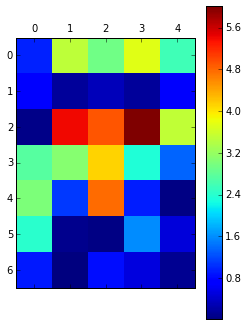

In [79]:
# Look at the uncorrected p-values for the GLM with diagnosis across networks
tmp = plt.matshow(-np.log10(pval_store))
tmp = plt.colorbar()

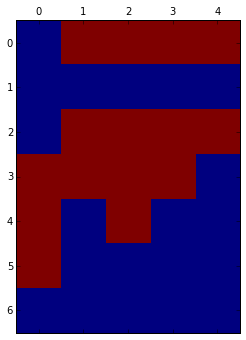

In [80]:
# Now look at the mask of p-values passing FDR Correction
pval_vec = np.reshape(pval_store, np.prod(pval_store.shape))
pcorr_vec = sts.multicomp.fdrcorrection0(pval_vec, 0.05)
pcorr_store = np.reshape(pcorr_vec[0], pval_store.shape)
tmp = plt.matshow(pcorr_store)

In [95]:
# the most salient effect
print(res_store[2][3].summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     19.42
Date:                Wed, 23 Mar 2016   Prob (F-statistic):           9.13e-20
Time:                        11:53:06   Log-Likelihood:                 185.87
No. Observations:                 384   AIC:                            -359.7
Df Residuals:                     378   BIC:                            -336.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs           0.0007      0.002  

In [82]:
# Find the p-values passing FDR (from the above mask)
np.argwhere(pcorr_store)

array([[0, 1],
       [0, 2],
       [0, 3],
       [0, 4],
       [2, 1],
       [2, 2],
       [2, 3],
       [2, 4],
       [3, 0],
       [3, 1],
       [3, 2],
       [3, 3],
       [4, 0],
       [4, 2],
       [5, 0]])

## Overview of subtypes across all networks

In [83]:
# Turn the grand average into an image
gdavg_img = nib.Nifti1Image(gdavg, affine=m_img.get_affine(), header=m_img.get_header())

In [84]:
# Turn the priors into an image
tmp_prior = nib.load(prior_path).get_data()

In [85]:
# Turn the priors into an image
prior = nib.load(prior_path)
prior_data = prior.get_data()
prior_temp = np.zeros((prior_data.shape + (scale,)))
for sc_id in range(scale):
    tmp = np.zeros_like(prior_data)
    tmp[prior_data==sc_id+1] = sc_id + 1
    prior_temp[..., sc_id] = tmp
prior_img = nib.Nifti1Image(prior_temp, affine=m_img.get_affine(), header=m_img.get_header())

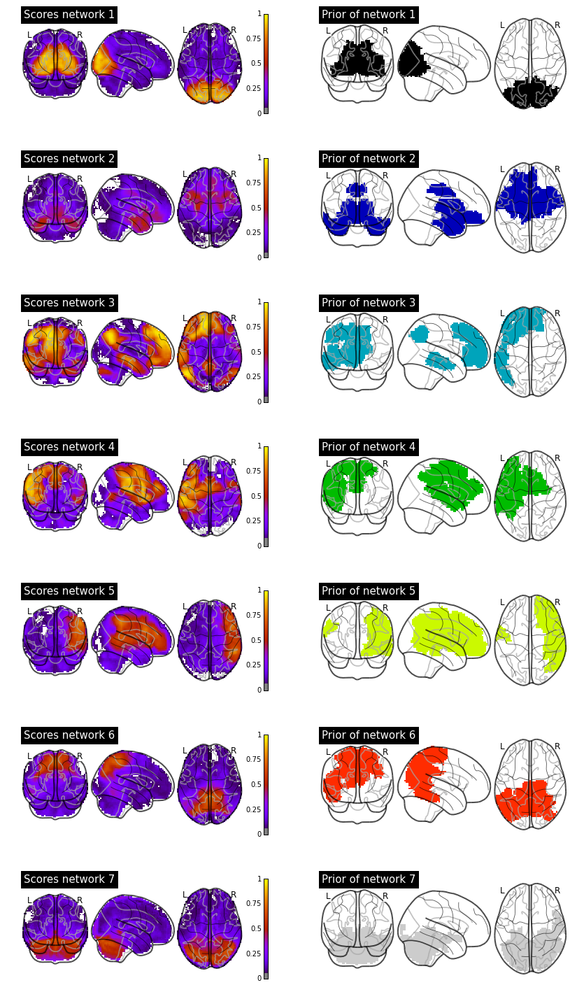

In [86]:
fig = plt.figure(figsize=(14,25))
gs = gridspec.GridSpec(7, 2, hspace=0.3)
for s_id in np.arange(0,7):
    ax1 = fig.add_subplot(gs[s_id,0])
    nlp.plot_glass_brain(nil.image.index_img(gdavg_img,s_id), cmap=plt.cm.gnuplot, 
                         axes=ax1, colorbar=True, title='Scores network {}'.format(s_id+1),
                        vmin=0, vmax=1)
    ax2 = fig.add_subplot(gs[s_id,1])
    nlp.plot_glass_brain(nil.image.index_img(prior_img,s_id), cmap=plt.cm.spectral, 
                         axes=ax2, colorbar=False, title='Prior of network {}'.format(s_id+1),
                        vmin=1, vmax=7)

## Network 1

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     1.337
Date:                Wed, 23 Mar 2016   Prob (F-statistic):              0.239
Time:                        11:50:29   Log-Likelihood:                 262.04
No. Observations:                 384   AIC:                            -512.1
Df Residuals:                     378   BIC:                            -488.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs          -0.0008      0.002  

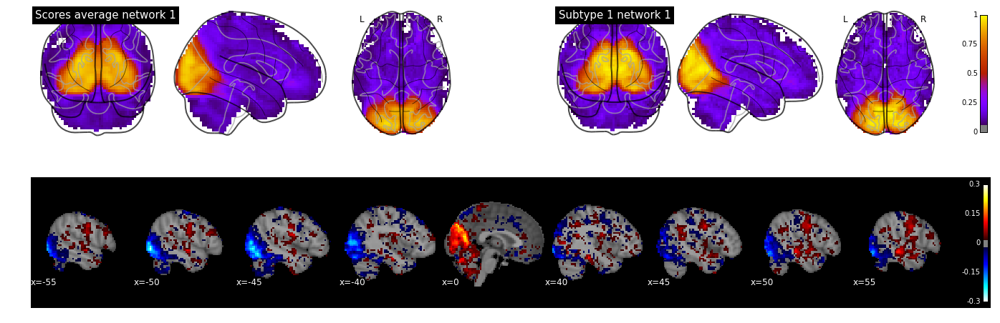

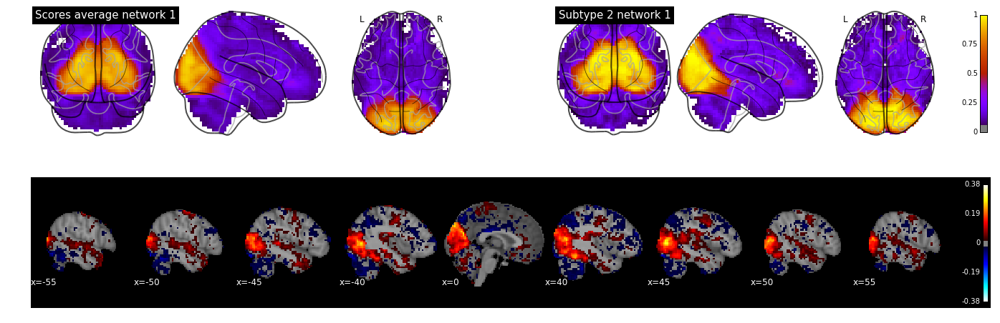

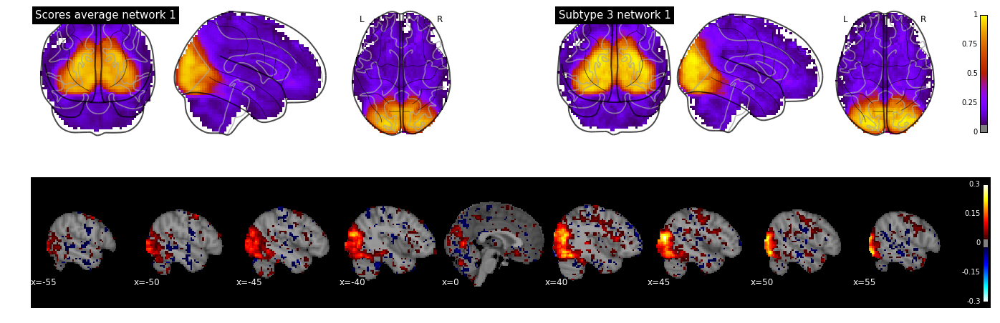

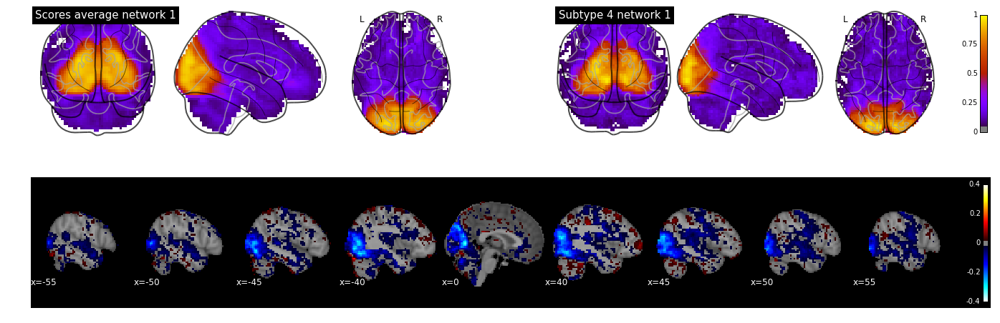

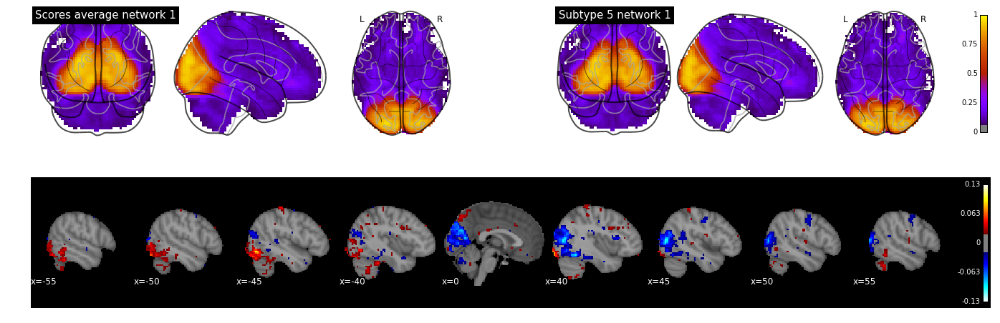

In [87]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 2

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     2.484
Date:                Wed, 23 Mar 2016   Prob (F-statistic):             0.0228
Time:                        11:50:49   Log-Likelihood:                 266.56
No. Observations:                 384   AIC:                            -521.1
Df Residuals:                     378   BIC:                            -497.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs          -0.0020      0.002  

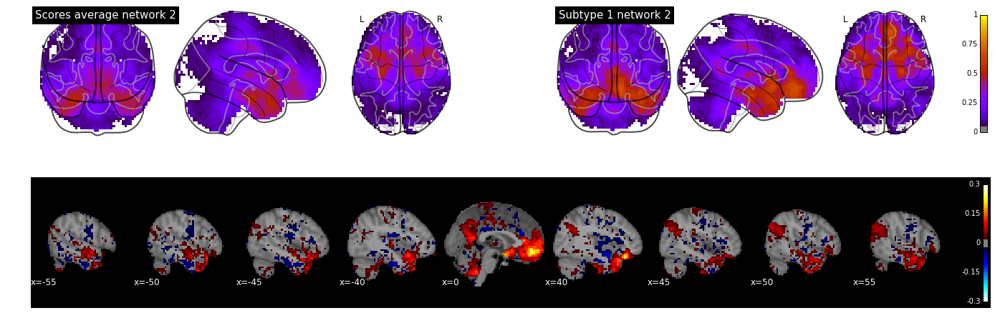

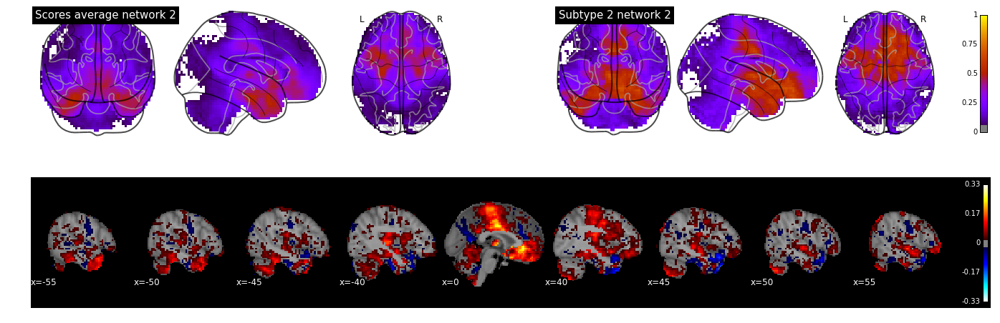

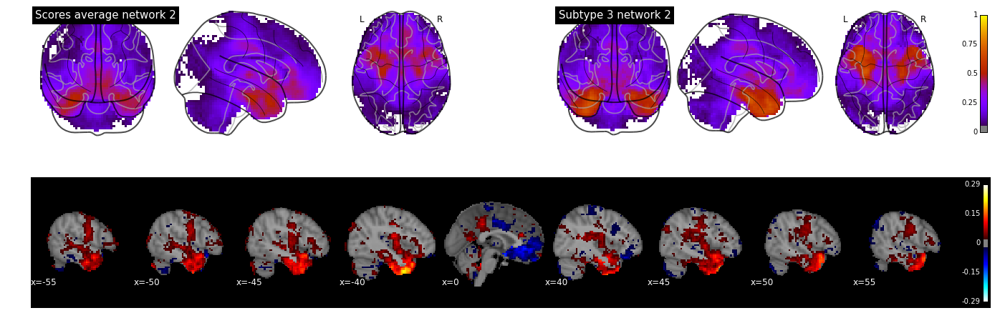

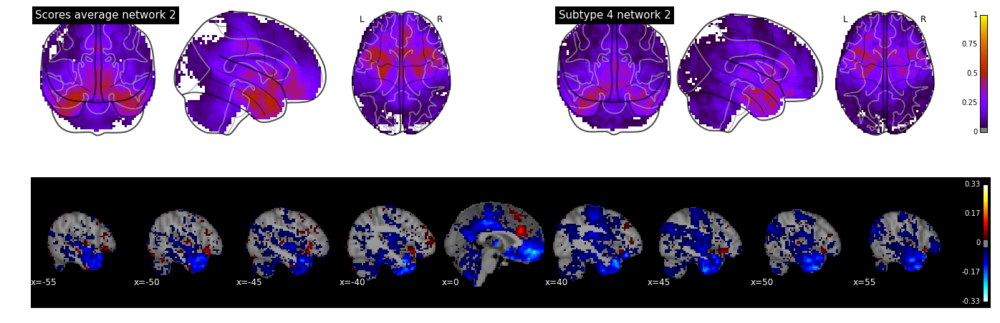

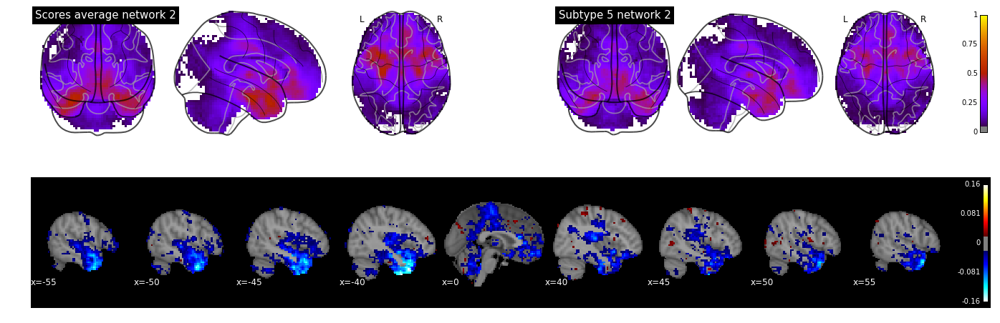

In [88]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 1
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 3

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.208
Date:                Wed, 23 Mar 2016   Prob (F-statistic):              0.301
Time:                        11:51:07   Log-Likelihood:                 305.93
No. Observations:                 384   AIC:                            -599.9
Df Residuals:                     378   BIC:                            -576.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs           0.0021      0.001  

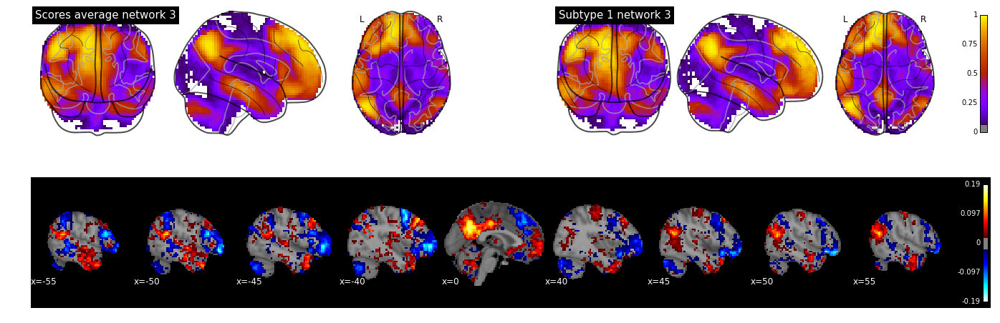

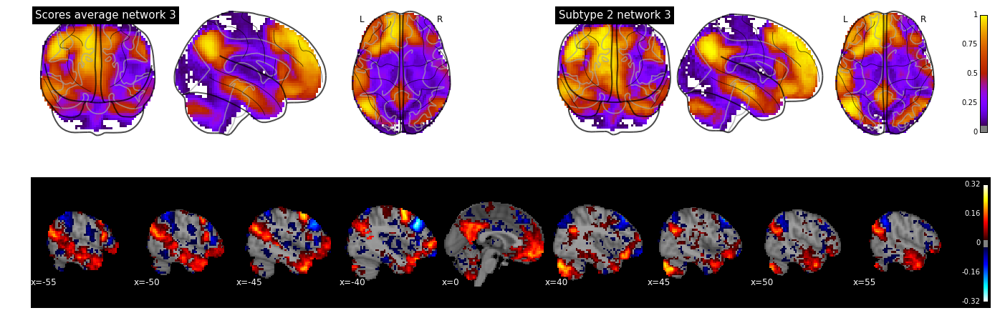

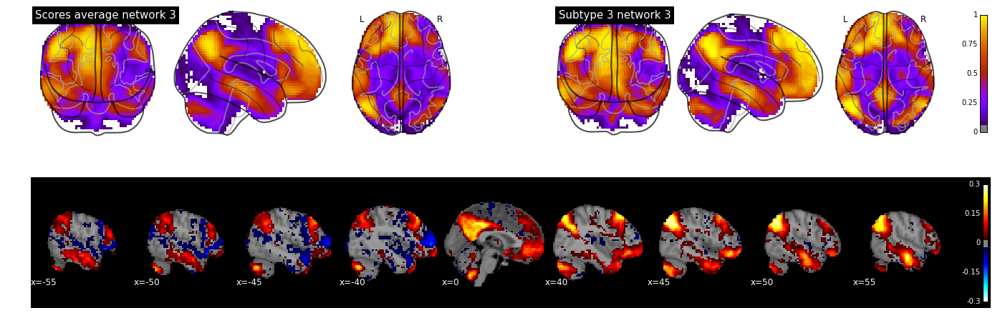

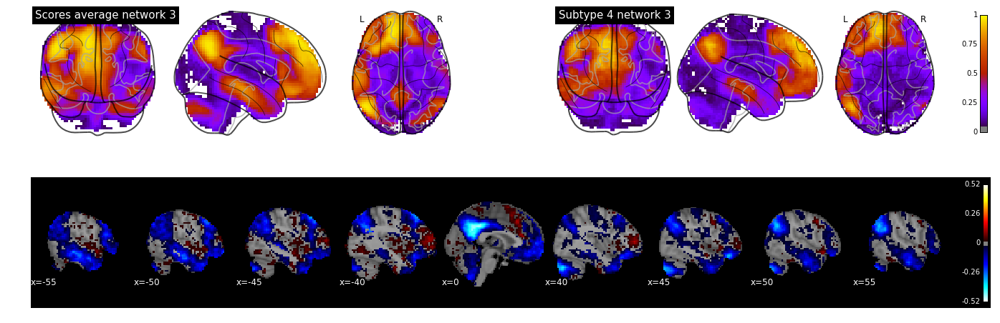

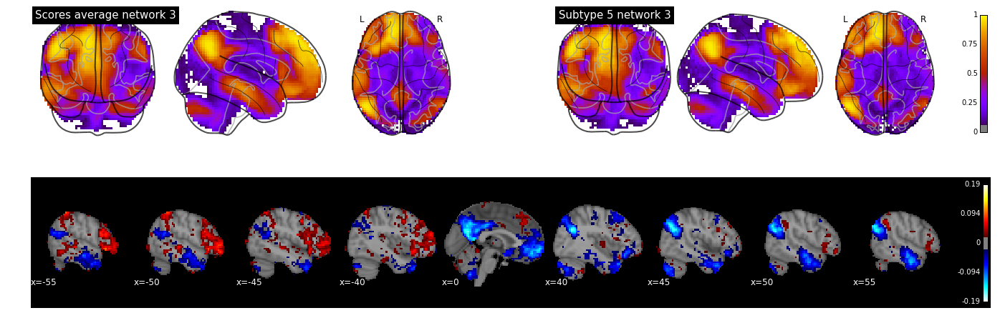

In [89]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 2
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 4

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.102
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     7.165
Date:                Wed, 23 Mar 2016   Prob (F-statistic):           2.99e-07
Time:                        11:51:26   Log-Likelihood:                 290.85
No. Observations:                 384   AIC:                            -569.7
Df Residuals:                     378   BIC:                            -546.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs          -0.0017      0.002  

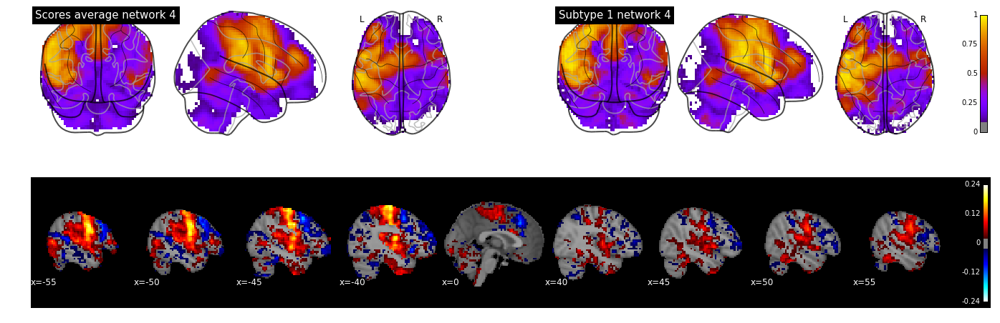

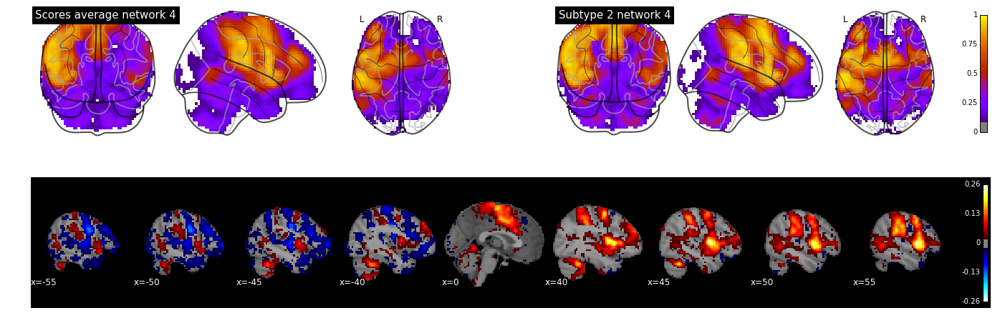

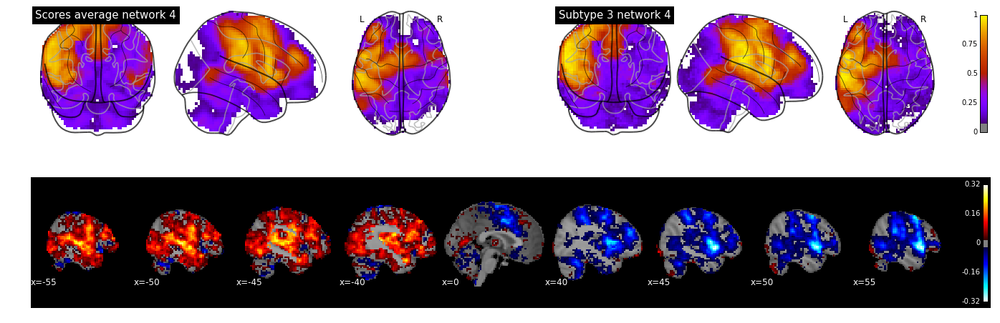

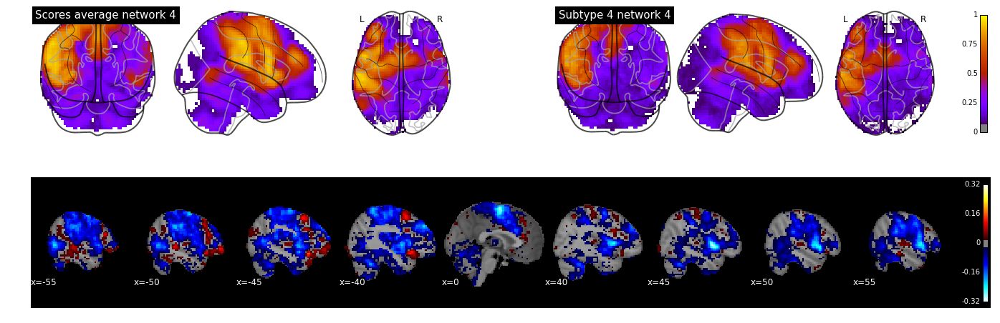

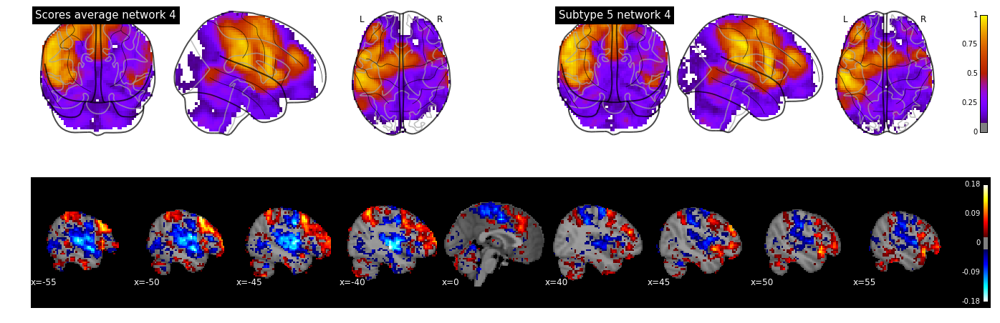

In [90]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 3
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 5

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.268
Model:                            OLS   Adj. R-squared:                  0.256
Method:                 Least Squares   F-statistic:                     23.04
Date:                Wed, 23 Mar 2016   Prob (F-statistic):           3.47e-23
Time:                        11:51:43   Log-Likelihood:                 173.56
No. Observations:                 384   AIC:                            -335.1
Df Residuals:                     378   BIC:                            -311.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs           0.0052      0.002  

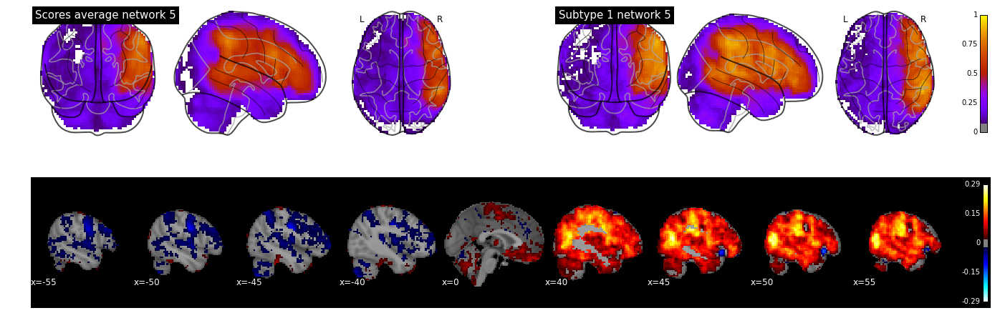

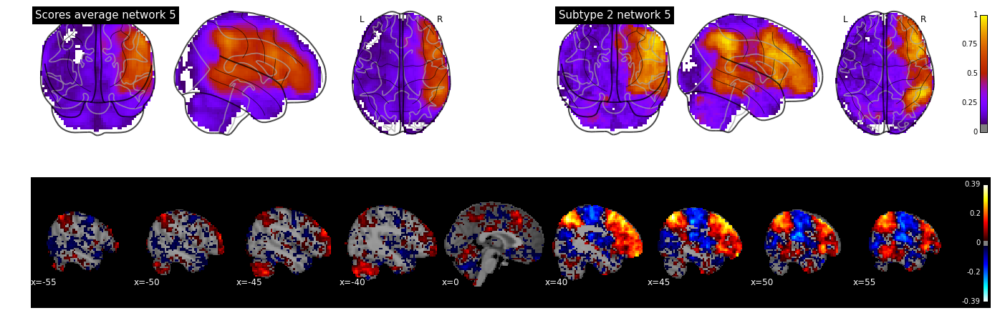

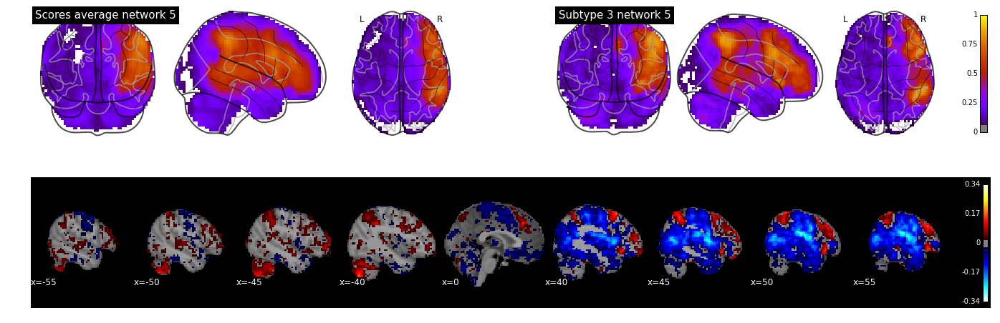

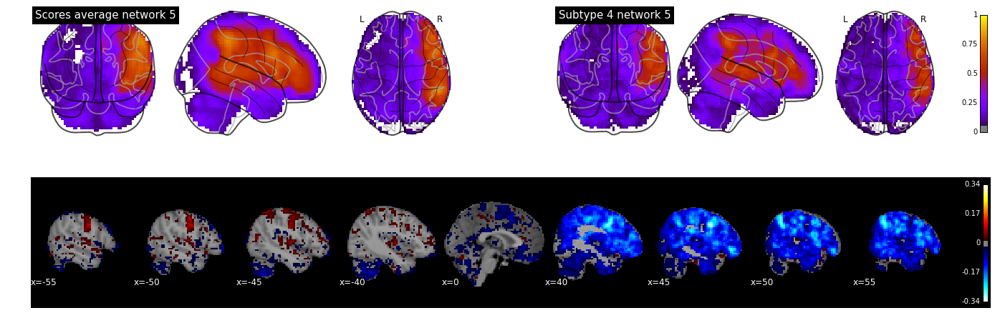

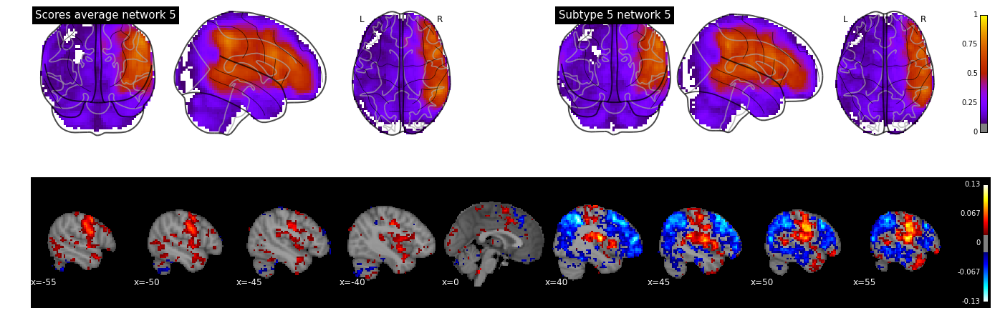

In [91]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 4
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 6

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     2.979
Date:                Wed, 23 Mar 2016   Prob (F-statistic):            0.00744
Time:                        11:52:02   Log-Likelihood:                 228.60
No. Observations:                 384   AIC:                            -445.2
Df Residuals:                     378   BIC:                            -421.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs           0.0014      0.002  

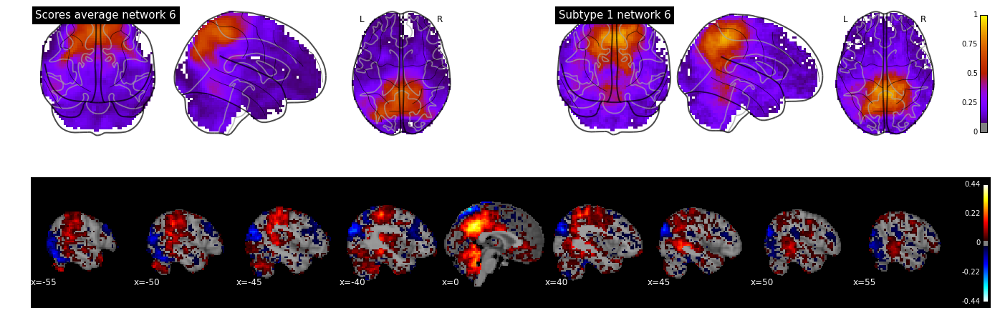

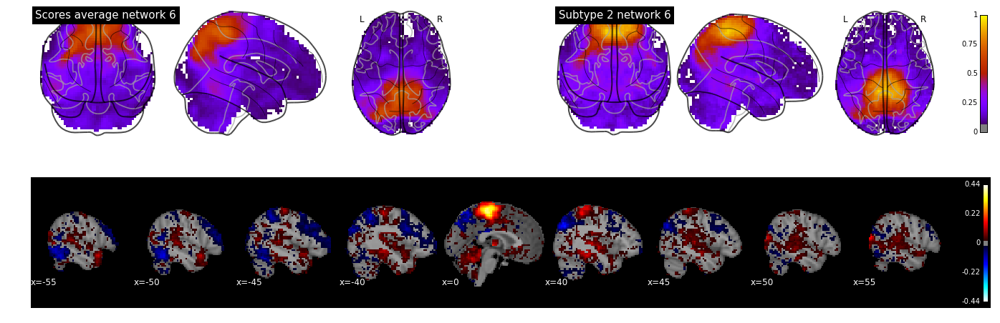

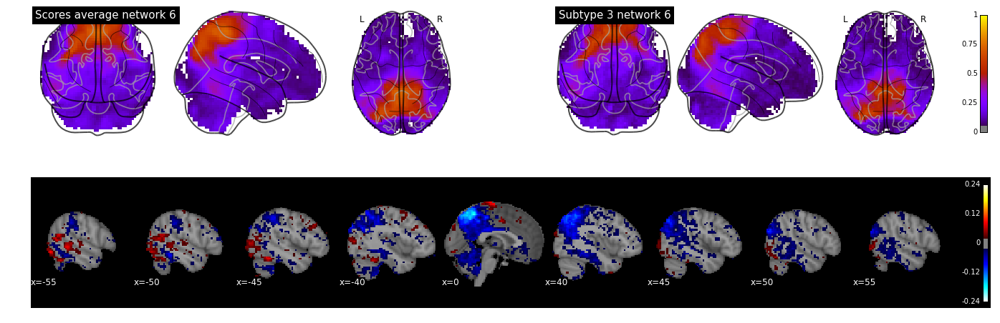

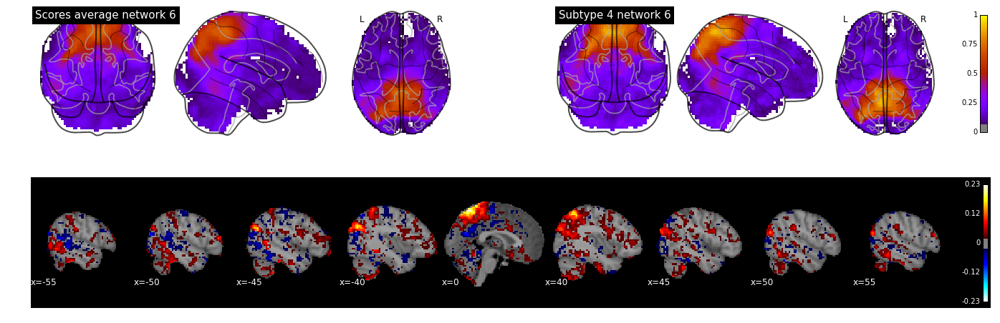

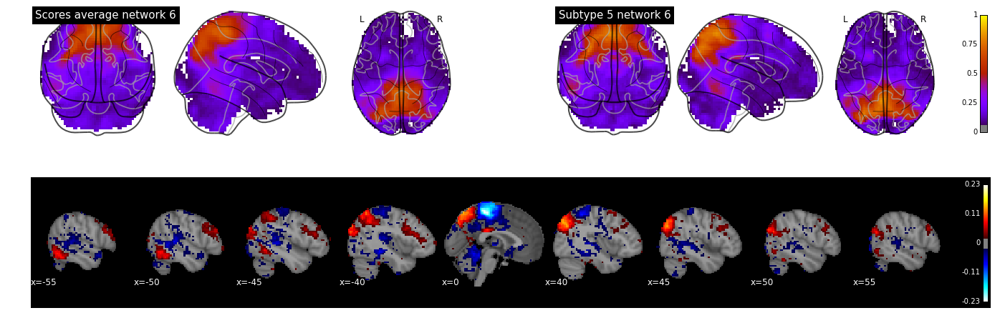

In [92]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 5
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 7

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     1.851
Date:                Wed, 23 Mar 2016   Prob (F-statistic):             0.0883
Time:                        11:52:21   Log-Likelihood:                 154.74
No. Observations:                 384   AIC:                            -297.5
Df Residuals:                     378   BIC:                            -273.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
Age_in_Yrs          -0.0014      0.002  

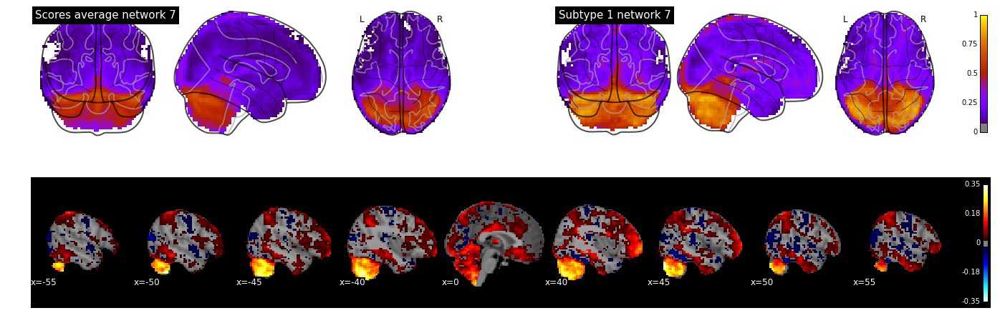

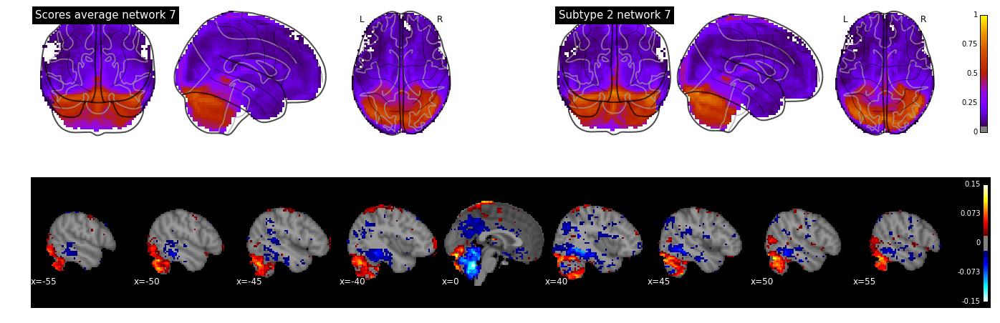

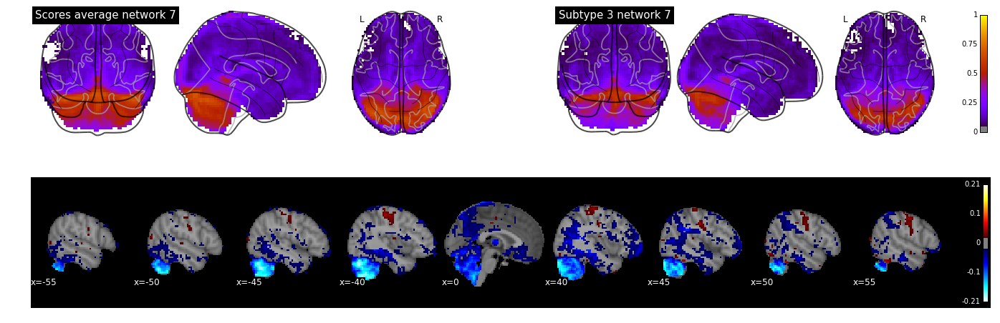

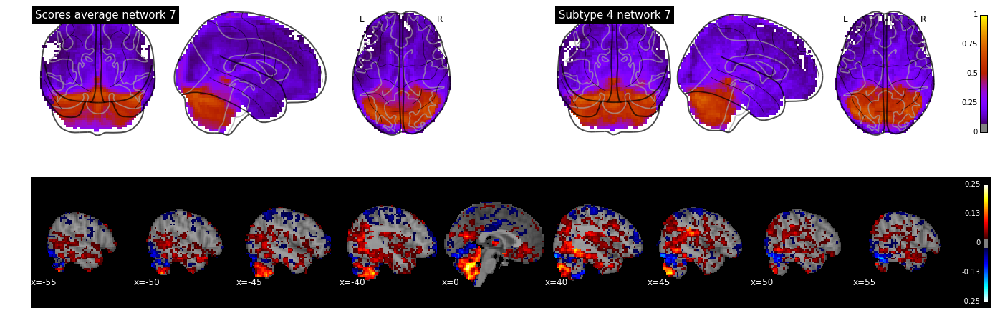

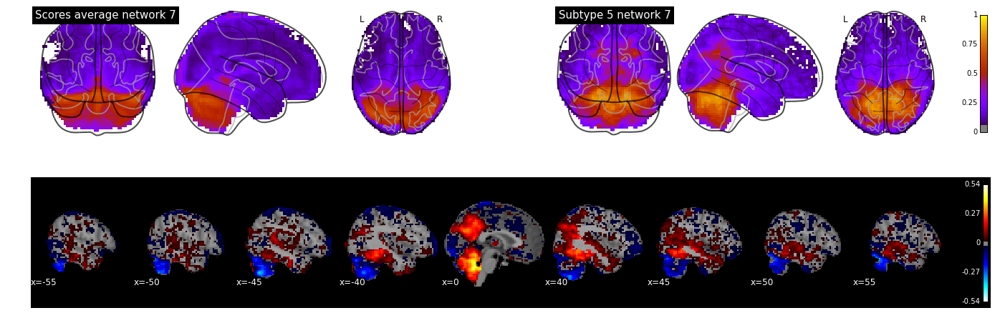

In [93]:
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 6
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())